# 🧠 API GPT-Image-1 – Ejemplos Prácticos con Edición de Imágenes

Este notebook forma parte del repositorio **`api-gpt-image-1`** y muestra cómo utilizar la API de OpenAI para **editar imágenes** mediante el modelo `gpt-image-1`. Los ejemplos están organizados paso a paso para ayudarte a entender las capacidades de edición visual del modelo y cómo aplicar modificaciones con y sin máscaras.

---

## 📌 ¿Qué incluye este notebook?
- ✅ Cómo generar una imagen desde un prompt
- ✅ Cómo editar una imagen sin máscara (modificaciones globales)
- ✅ Cómo editar una imagen con una máscara (modificaciones localizadas)
- ✅ Cómo crear una composición visual con múltiples imágenes de entrada
- ✅ Como generar un sprite con fondo transparente
- 💡 Cada sección contiene instrucciones claras para que puedas replicarlo fácilmente

---

In [1]:
!pip install -qU openai

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 680.9/680.9 kB 11.4 MB/s eta 0:00:00


In [2]:
import openai
import os
from PIL import Image
import base64
from io import BytesIO
from IPython.display import display

In [3]:
with open("/content/api_key.txt") as archivo:
  apikey = archivo.read()
os.environ["OPENAI_API_KEY"] = apikey

### Ejemplo 1: Generación de imagen desde cero
Genera una imagen completamente nueva a partir de un prompt textual. Es el uso más directo del modelo `gpt-image-1`, sin necesidad de imagen base ni máscara. Ideal para ilustraciones creativas, conceptos visuales o escenas imaginadas.

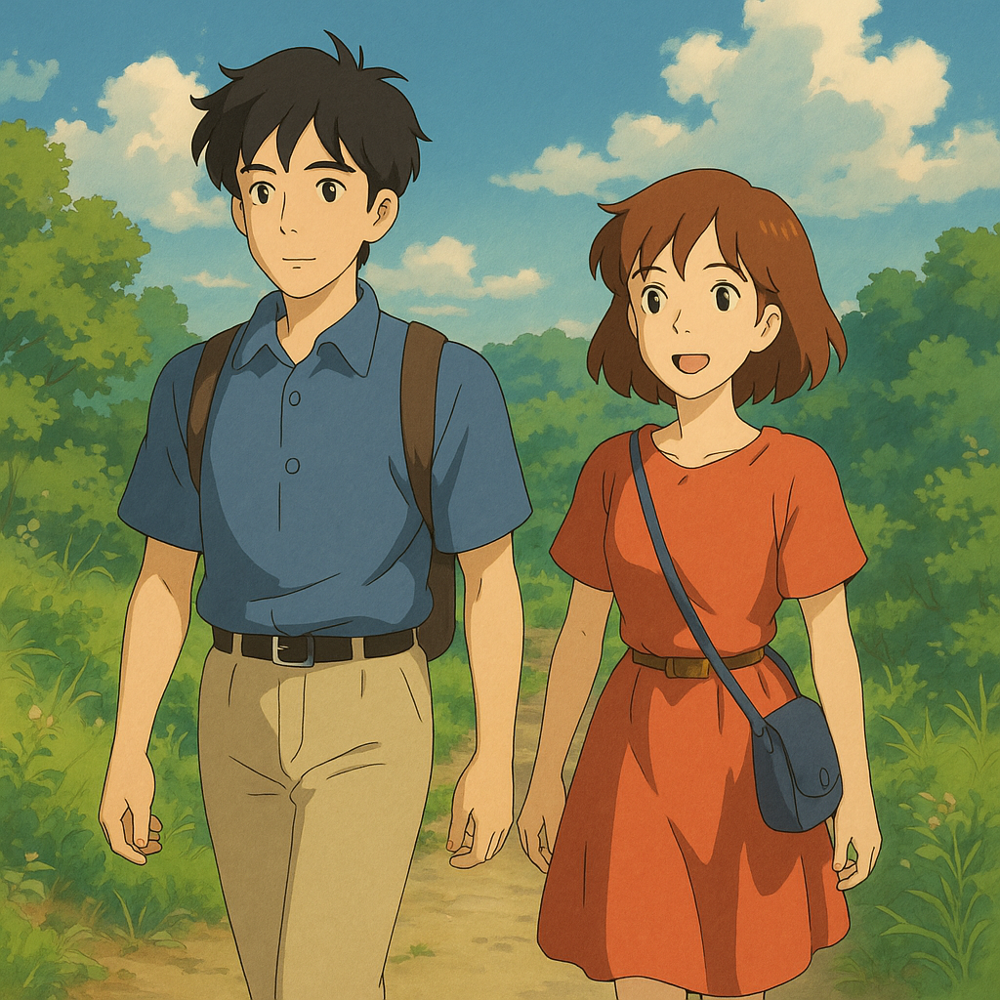

In [16]:
response = openai.images.generate(
            model="gpt-image-1",
            prompt="Genera una imagen de dos personas caminando al estilo del estudio Studio Ghibli",
            n=1,
            size="1024x1024"
        )

image_data = base64.b64decode(response.data[0].b64_json)  # Extraccion yDecodificacion
image = Image.open(BytesIO(image_data))  # Abrir imagen con PIL
# Mostramos la imagen
display(image)

### Ejemplo 2: Edición sin máscara
Edita toda la imagen aplicando un nuevo escenario (por ejemplo, cambiar el cielo por un atardecer). Solo se necesita la imagen base y un prompt.

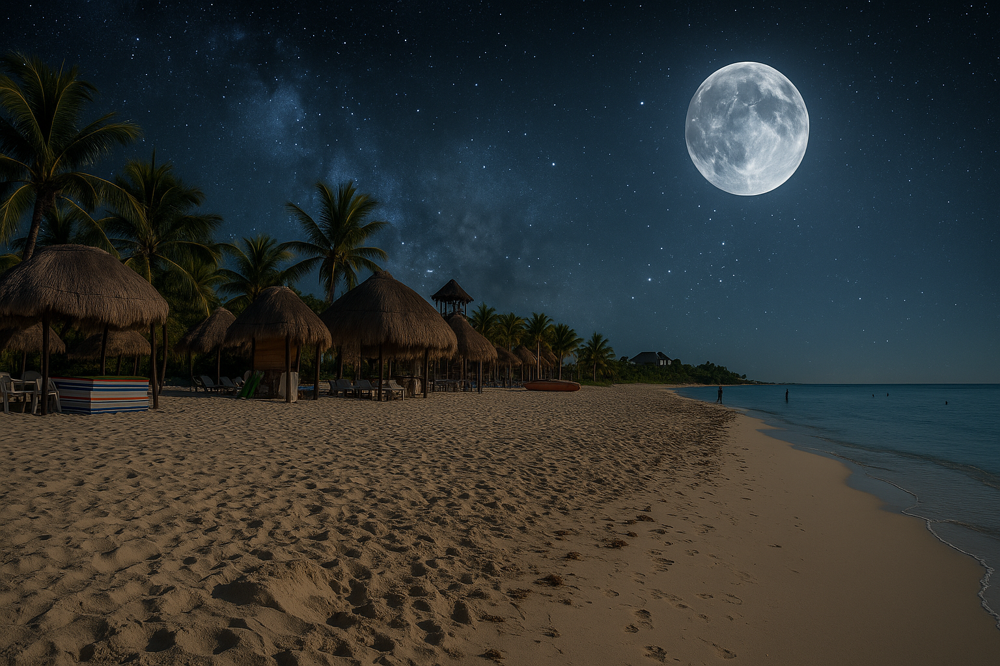

In [15]:
# Abrir directamente sin modificar el objeto
with open("/content/playa.jpg", "rb") as image_file:
    response = openai.images.edit(
        model="gpt-image-1",
        image=image_file,
        prompt="Cambia el cielo por uno estrellado con una luna brillante",
        #size="1024x1024",
        quality="high",
        background="auto"
    )
    img = Image.open(BytesIO(base64.b64decode(response.data[0].b64_json)))
    display(img)

### Ejemplo 3: Edición con máscara
Edita solo una parte de la imagen. Las zonas a modificar se indican mediante una máscara transparente (PNG del mismo tamaño que la imagen base).

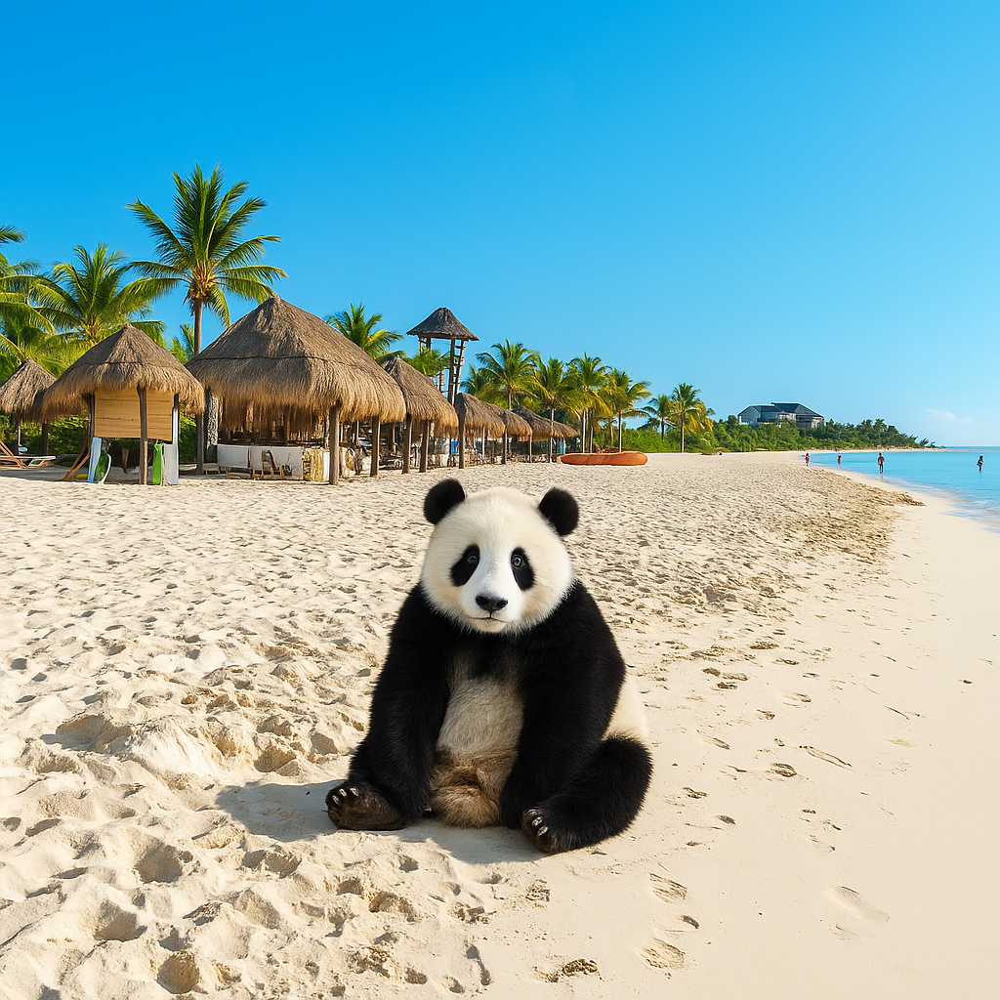

In [19]:
# Abrimos la imagen base (JPG, PNG o WEBP)
with open("/content/playa.jpg", "rb") as image_file, open("/content/mascara.png", "rb") as mask_file:
    # Enviamos la imagen, la máscara y el prompt al modelo gpt-image-1
    response = openai.images.edit(
        model="gpt-image-1",
        image=image_file,
        mask=mask_file,
        prompt="En la zona marcada, agrega un oso panda",
        size="1024x1024",
        quality="high",
        background="auto"
    )

    # Decodificamos y mostramos la imagen generada
    imagen_generada = Image.open(BytesIO(base64.b64decode(response.data[0].b64_json)))
    display(imagen_generada)

### Ejemplo 4: Composición visual con múltiples imágenes de entrada
Este ejemplo muestra cómo usar varias imágenes (una base y otras que representan elementos a incorporar) junto a un prompt para componer una nueva escena. Ideal para tareas como collages, composición creativa o storytelling visual.

Las imágenes proporcionadas se consideran elementos de entrada que el modelo utilizará como referencia para generar la escena descrita.

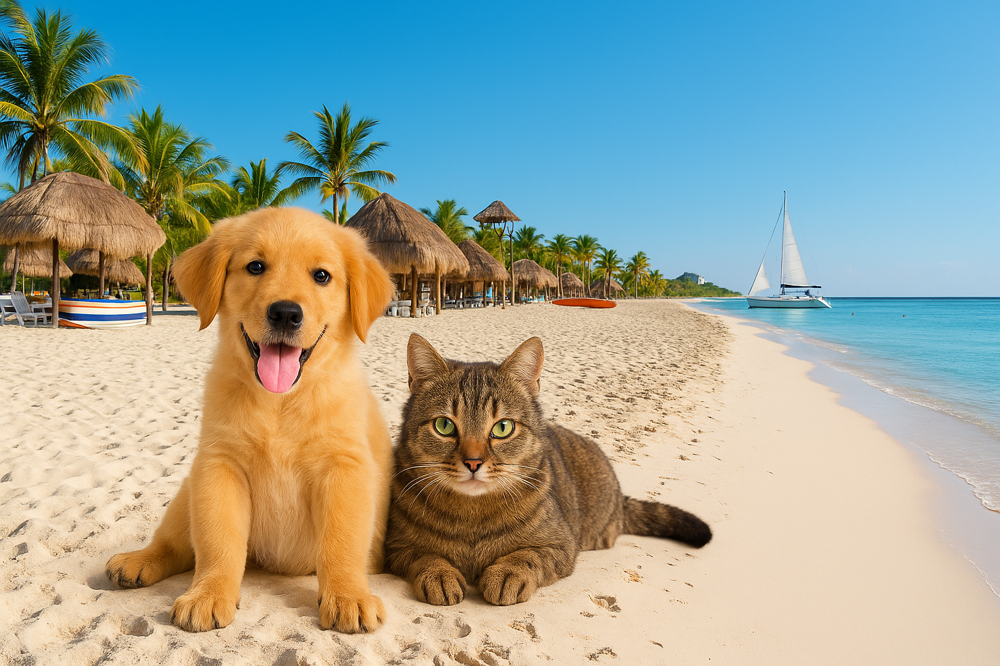

In [22]:
prompt = """
Generate a imagen tomando de fondo la playa
y sobre ella el perro y el gato que estan disfrutando,
y en la parte detras sobre el mar un barco.
"""

result = openai.images.edit(
    model="gpt-image-1",
    image=[
        open("/content/playa.jpg", "rb"),
        open("/content/perro.jpg", "rb"),
        open("/content/gato.jpg", "rb"),
    ],
    prompt=prompt
)

# Decodificamos y mostramos la imagen generada
imagen_generada = Image.open(BytesIO(base64.b64decode(result.data[0].b64_json)))
display(imagen_generada)

### Ejemplo 5: Generación de sprite estilo anime con fondo transparente
Este ejemplo genera una imagen con fondo transparente, útil para assets visuales como stickers, sprites de videojuegos o diseño gráfico. Se especifica `"background": "transparent"` y el resultado se guarda como archivo `.png`.

In [21]:
result = openai.images.generate(
    model="gpt-image-1",
    prompt="gatito blanco estilo anime",
    size="1024x1024",
    background="transparent",
    quality="high",
)

image_bytes = base64.b64decode(result.data[0].b64_json)
# Save the image to a file
with open("sprite_gatito.png", "wb") as f:
    f.write(image_bytes)